# Семинар 7 - Детекция и сопоставление ключевых точек

Данный семинар содержит две части: первая с неоцениваемыми опциональными заданиями, и вторая часть с **Домашним заданием**

***

In [ ]:
import numpy as np
from scipy import ndimage, stats
from time import perf_counter
import cv2
import matplotlib.pyplot as plt
from itertools import product
import hashlib

sha = lambda a: hashlib.sha256(a.tobytes()).hexdigest()

# Данные

Изображения взяты из папки samples репозитория opencv: https://github.com/opencv/opencv/tree/4.x/samples/data

In [ ]:
!mkdir data
!wget https://github.com/opencv/opencv/raw/4.x/samples/data/box.png -O ./data/box.png
!wget https://github.com/opencv/opencv/raw/4.x/samples/data/box_in_scene.png -O ./data/box_in_scene.png

--2025-05-15 14:20:56--  https://github.com/opencv/opencv/raw/4.x/samples/data/box.png
Resolving github.com (github.com)... 140.82.116.4
Connecting to github.com (github.com)|140.82.116.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/opencv/opencv/4.x/samples/data/box.png [following]
--2025-05-15 14:20:56--  https://raw.githubusercontent.com/opencv/opencv/4.x/samples/data/box.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 50728 (50K) [image/png]
Saving to: ‘./data/box.png’

./data/box.png      100%[===================>]  49.54K  --.-KB/s    in 0.008s  

2025-05-15 14:20:56 (6.14 MB/s) - ‘./data/box.png’ saved [50728/50728]

--2025-05-15 14:20:57--  https://github.com/opencv/opencv/raw/4.

In [ ]:
img_1 = cv2.imread('/content/the_ambassadors.jpg', cv2.IMREAD_GRAYSCALE)

img_2 = cv2.imread('/content/the_ambassadors_skull_transformed.jpg', cv2.IMREAD_GRAYSCALE)

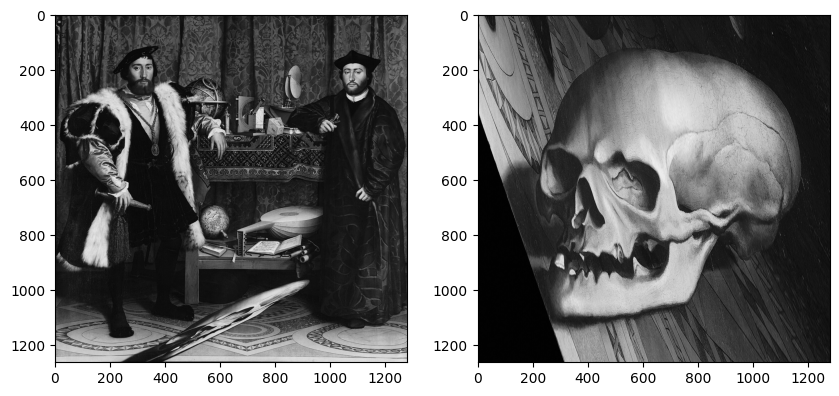

In [ ]:
plt.figure(figsize=[10, 10])
plt.subplot(1, 2, 1)
plt.imshow(img_1, cmap='Greys_r')
plt.subplot(1, 2, 2)
plt.imshow(img_2, cmap='Greys_r')

In [ ]:
img_1.shape

(1261, 1280)

# Извлечение ключевых точек: ORB

- Rublee, Ethan, et al. "ORB: An efficient alternative to SIFT or SURF." 2011 International conference on computer vision. Ieee, 2011. [[pdf]](https://d1wqtxts1xzle7.cloudfront.net/63685366/ORB-_An_efficient_alternative_to_SIFT_or_SURF20200619-118758-d5kgfr-libre.pdf?1592635646=&response-content-disposition=inline%3B+filename%3DORB_an_efficient_alternative_to_SIFT_or.pdf&Expires=1678814267&Signature=bylBe0Mp4cefN84Bzcx1RZP0mUe7ZGLkYFAYAZ1~rbgXQtNFXbMryWE-FcG~sYLMhk9hKdwGVzvgLYGb-OZazU5dcsurJl7Fw4Csg7lThUE8Kh~SYK9fqG8XrMpQlUn3hIMrobrTH9qvAMeVBNs0ZCTPmvFI5o04OW73ysIS6BoX0nsLMUxtYZa8zvIJvZJSey6POYB8-IXQO8Jvu0e3mvzwViUXxvByCJwycTHC1oObfH6mFU6cg4A0SPUNdiKdmZOvx0nmhvY96NRuu7aMX8I6mrU6x02NBQZtTRebP3RoQqtBhr-5X~c40uxY-big5AnZu2fc-qP8OWZ0lnx~xg__&Key-Pair-Id=APKAJLOHF5GGSLRBV4ZA)

[Туториал на medium](https://medium.com/@deepanshut041/introduction-to-orb-oriented-fast-and-rotated-brief-4220e8ec40cf)



In [ ]:
# Initiate ORB detector
orb = cv2.ORB_create()

# find the keypoints and descriptors with ORB
kp_1, des_1 = orb.detectAndCompute(img_1, None)
kp_2, des_2 = orb.detectAndCompute(img_2, None)

Каждая ключевая точка характеризуется:
1. angle - углом, что позволяет вычислять дескрипторы, инвариантные к повороту,
2. octave - октавой, определяющей масштаб, на котором была обнаружена ключевая точка,
3. pt - субпиксельными координатами этой ключевой точки на изображении,
4. response - величиной отклика детектора,
5. size - размером (для визуализации величины отклика)

In [ ]:
print('type(kp_1) =', type(kp_1))
print('len(kp_1) =', len(kp_1))
print()
print('kp_1[0] =', kp_1[0])
print()
print('kp_1[0].angle = ', kp_1[0].angle)
print('kp_1[0].octave = ', kp_1[0].octave)
print('kp_1[0].pt = ', kp_1[0].pt)
print('kp_1[0].response = ', kp_1[0].response)
print('kp_1[0].size = ', kp_1[0].size)

type(kp_1) = <class 'tuple'>
len(kp_1) = 500

kp_1[0] = < cv2.KeyPoint 0x7c55cfcdeca0>

kp_1[0].angle =  160.70712280273438
kp_1[0].octave =  0
kp_1[0].pt =  (800.0, 475.0)
kp_1[0].response =  0.0017107255989685655
kp_1[0].size =  31.0


Дескрипторы - это вектора фиксированной длины для каждой ключевой точки

In [ ]:
print('type(des_1) =', type(des_1))
print('des_1.shape =', des_1.shape)
print('des_1.dtype =', des_1.dtype)

type(des_1) = <class 'numpy.ndarray'>
des_1.shape = (500, 32)
des_1.dtype = uint8


In [ ]:
img_1_kp = cv2.drawKeypoints(img_1, kp_1, None, (255, 0, 0), 4)
img_2_kp = cv2.drawKeypoints(img_2, kp_2, None, (255, 0, 0), 4)

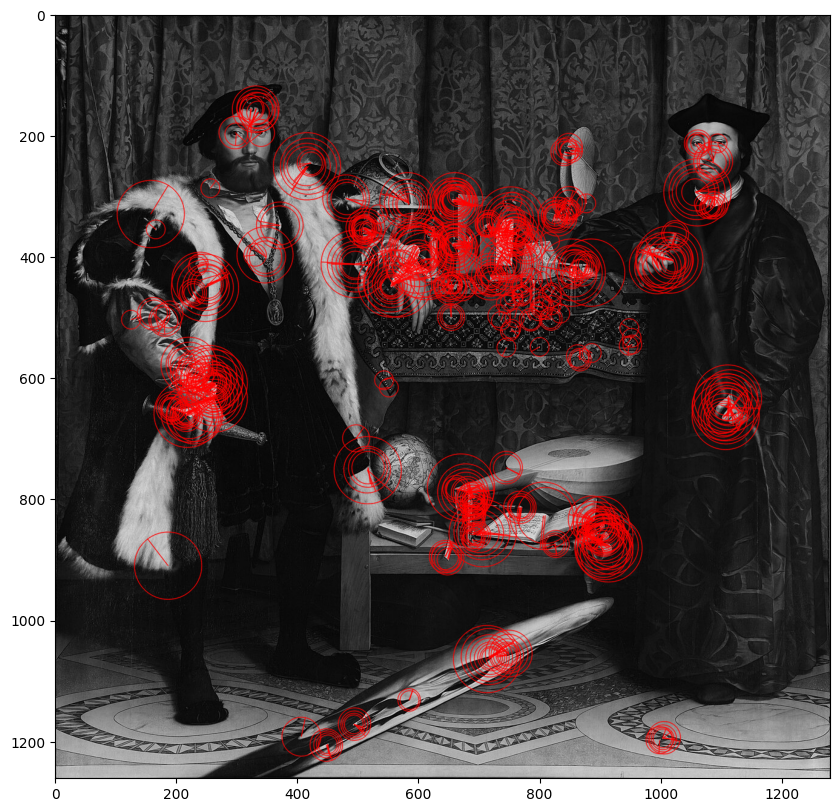

In [ ]:
plt.figure(figsize=[10, 10])
plt.imshow(img_1_kp)

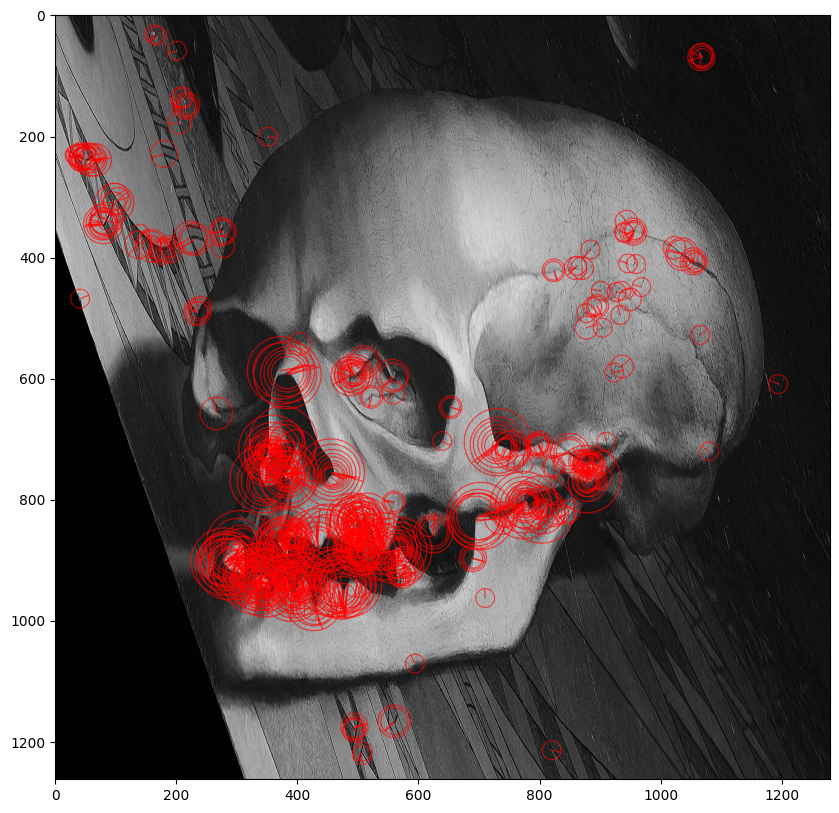

In [ ]:
plt.figure(figsize=[10, 10])
plt.imshow(img_2_kp)

# Вопрос 1

_(самостоятельная работа без проверки и оценки)_

О чем говорит наличие концентрических окружностей?

**Ответ:**

# Вопрос 2

_(самостоятельная работа без проверки и оценки)_

Каким способом можно избавиться от избыточных близких ключевых точек? И нужно ли это делать?

**Ответ:**

# Сопоставление ключевых точек: Brute-Force

[Туториал OpenCV по Feature Matching](https://docs.opencv.org/3.0-beta/doc/py_tutorials/py_feature2d/py_matcher/py_matcher.html#)

Для сопоставления ключевых точек методом грубого перебора можно использовать функцию `cv2.BFMatcher()`.

Она принимает на вход два аргумента:
1. `normType` - какая меру дистанции между дескрипторами будет использоваться
2. `crossCheck` - при значении `True` возвращает только пары (i, j), такие, что i-й дескриптор из первого имеет в качестве наилучшего совпадения j-й дескриптор из второго множества (и наоборот).

In [ ]:
matcher = cv2.BFMatcher(cv2.NORM_HAMMING2, crossCheck=True)
matches = matcher.match(des_1, des_2)

# top-20 matches
matches = sorted(matches, key=lambda x: x.distance)
matches = matches[:20]

In [ ]:
img_matches = cv2.drawMatches(img_1, kp_1, img_2, kp_2, matches, None, flags=2)

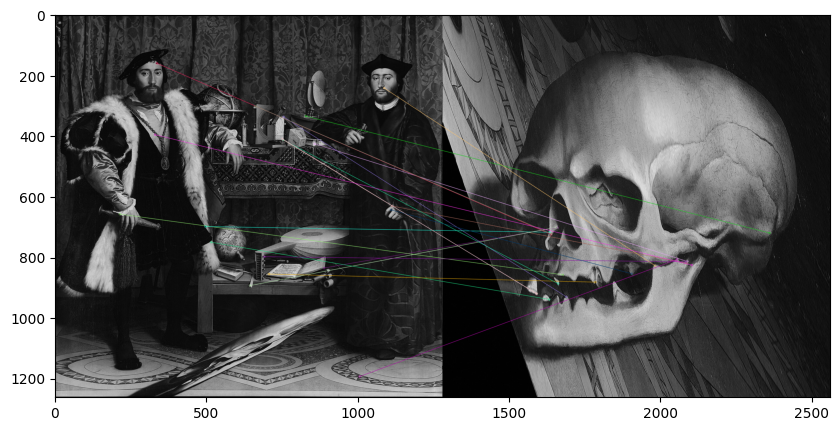

In [ ]:
plt.figure(figsize=[10, 10])
plt.imshow(img_matches)

# Выравнивание изображений

In [ ]:
src_pts = np.float32([ kp_1[m.queryIdx].pt for m in matches ]).reshape(-1,1,2)
dst_pts = np.float32([ kp_2[m.trainIdx].pt for m in matches ]).reshape(-1,1,2)

M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

In [ ]:
M

array([[ 5.97515365e+00, -5.22660286e+00,  8.45367548e+02],
       [ 6.08261952e+00, -5.28795241e+00,  8.33632783e+02],
       [ 7.41018478e-03, -6.41987189e-03,  1.00000000e+00]])

In [ ]:
img_1_transformed = cv2.warpPerspective(img_1, M, img_2.shape[0:2][::-1])

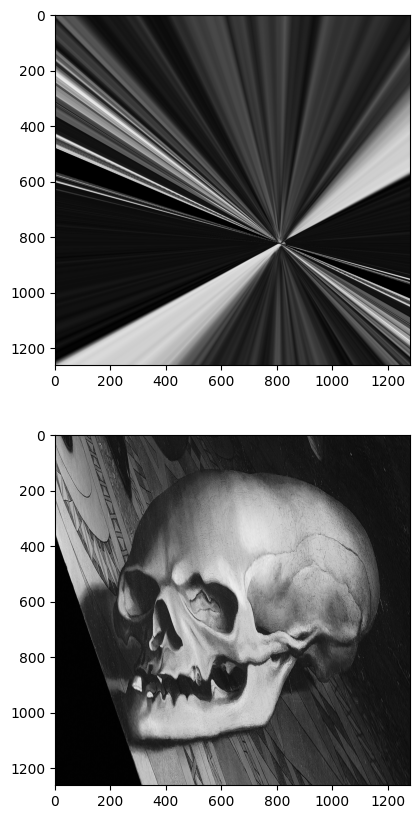

In [ ]:
plt.figure(figsize=[20, 10])
plt.subplot(2, 1, 1)
plt.imshow(img_1_transformed, cmap='Greys_r')
plt.subplot(2, 1, 2)
plt.imshow(img_2, cmap='Greys_r')

# SURF

Основные отличия между детекторами ORB (Oriented FAST and Rotated BRIEF) и SURF (Speeded Up Robust Features) заключаются в следующем:

- Скорость: ORB быстрее, чем SURF. Это связано с тем, что ORB использует бинарный дескриптор и более быстрый алгоритм обнаружения ключевых точек (FAST), в то время как SURF использует дескриптор с плавающей запятой и более вычислительно сложный алгоритм обнаружения ключевых точек.
- Инвариантность к масштабу: SURF обладает более высокой инвариантностью к масштабу, чем ORB. Это связано с тем, что SURF использует представление изображения в масштабированном виде (scale-space representation of the image) для обнаружения ключевых точек на разных масштабах, тогда как ORB использует фиксированный размер пирамиды масштабов (fixed-size scale pyramid).
- Инвариантность к повороту: ORB более инвариантен к повороту, чем SURF. ORB вычисляет дескриптор, который инвариантен к повороту, в то время как SURF вычисляет дескриптор, который не полностью инвариантен к повороту, но может быть сделан таковым с помощью дополнительных вычислений.
- Устойчивость к шуму и размытию: SURF в целом более устойчив к шуму и размытию, чем ORB, из-за использования в процессе обнаружения ключевых точек гауссовского фильтра.

[Туториал на medium](https://medium.com/@deepanshut041/introduction-to-surf-speeded-up-robust-features-c7396d6e7c4e)

**Основным заданием** будет ознакомиться со статьями:

1. [Speeded-Up Robust Features (SURF)](https://www.sciencedirect.com/science/article/pii/S1077314207001555)
2. [An Analysis of the SURF Method](https://www.ipol.im/pub/art/2015/69/article_lr.pdf) (опционально, расширенный анализ метода)

Опираясь на статьи, необходимо дополнить недостающие строчки кода. Во многих местах достаточно одной строки, реализующей ту или иную операцию.

Сначала ознакомьтесь со вспомогательными функциями:

In [ ]:
def integral_image(image):
    '''Вычисляет интегральное изображение
    '''
    return image.cumsum(axis=0).cumsum(axis=1)


def partial_sums(integral, x, y, w, h, kernel_size, spatial_step):
    '''Вычисляет свертку изображения на основе интегрального изображения.
    Ядро свертки имеет размер kernel_size x kernel_size и движется
    с шагом spatial_step.

    По изображению движется ядро размера kernel_size x kernel_size
    с шагом spatial_step. Это ядро состоит из нулей, кроме прямоугольника
    с верхним левым углом (x, y) и размерами (ширина, высота) = (w, h).
    '''
    H, W = integral.shape[:2]
    integral = np.pad(integral, 1)
    x, y = x + 1, y + 1

    y1 = y - 1
    y2 = H - (kernel_size - y1) + 1
    x1 = x - 1
    x2 = W - (kernel_size - x1) + 1
    b1 = integral[y1:y2:spatial_step, x1:x2:spatial_step]

    y1 = y - 1
    y2 = H - (kernel_size - y1) + 1
    x1 = x + w - 1
    x2 = W - (kernel_size - x1) + 1
    b2 = integral[y1:y2:spatial_step, x1:x2:spatial_step]

    y1 = y + h - 1
    y2 = H - (kernel_size - y1) + 1
    x1 = x - 1
    x2 = W - (kernel_size - x1) + 1
    b3 = integral[y1:y2:spatial_step, x1:x2:spatial_step]

    y1 = y + h - 1
    y2 = H - (kernel_size - y1) + 1
    x1 = x + w - 1
    x2 = W - (kernel_size - x1) + 1
    b4 = integral[y1:y2:spatial_step, x1:x2:spatial_step]

    return b4 - b2 - b3 + b1

# Задание 1: Вспомогательные функции

_(самостоятельная работа без проверки и оценки)_

Допишите оператор return в тех функциях, где это необходимо.

In [ ]:
def Dx(integral, kernel_size):
    '''Первая производная по X
    '''
    left = partial_sums(integral, 0, 0, kernel_size // 2, kernel_size, kernel_size, 1)
    right = partial_sums(integral, kernel_size // 2, 0, kernel_size // 2, kernel_size, kernel_size, 1)
    return right - left



def Dy(integral, kernel_size):
    '''Первая производная по Y
    '''
    up = partial_sums(integral, 0, 0, kernel_size, kernel_size // 2, kernel_size, 1)
    bottom = partial_sums(integral, 0, kernel_size // 2, kernel_size, kernel_size // 2, kernel_size, 1)
    return bottom - up



def Dxx(integral, kernel_size, spatial_step):
    '''Вторая производная по X
    '''
    shift = round(kernel_size * 2 / 9)
    h = kernel_size - 2 * shift

    w1 = round(kernel_size / 3)
    w2 = round(kernel_size / 3)
    w3 = kernel_size - w1 - w2

    c1 = (3 * 5) / (w1 * h)
    c2 = (3 * 5) / (w2 * h)
    c3 = (3 * 5) / (w3 * h)

    left = partial_sums(integral, 0, shift, w1, h, kernel_size, spatial_step)
    center = partial_sums(integral, 0 + w1, shift, w2, h, kernel_size, spatial_step)
    right = partial_sums(integral, 0 + w1 + w2, shift, w3, h, kernel_size, spatial_step)

    return c1 * left - c2 * center + c3 * right





def Dyy(integral, kernel_size, spatial_step):
    '''Вторая производная по Y
    '''
    shift = round(kernel_size * 2 / 9)
    w = kernel_size - 2 * shift

    h1 = round(kernel_size / 3)
    h2 = round(kernel_size / 3)
    h3 = kernel_size - h1 - h2

    c1 = (3 * 5) / (h1 * w)
    c2 = (3 * 5) / (h2 * w)
    c3 = (3 * 5) / (h3 * w)

    top = partial_sums(integral, shift, 0, w, h1, kernel_size, spatial_step)
    center = partial_sums(integral, shift, 0 + h1, w, h2, kernel_size, spatial_step)
    bottom = partial_sums(integral, shift, 0 + h1 + h2, w, h3, kernel_size, spatial_step)

    return c1 * top - c2 * center + c3 * bottom



def Dxy(integral, kernel_size, spatial_step):
    '''Смешанная производная по XY
    '''
    shift_1 = round(kernel_size * 1 / 9)
    shift_2 = round(kernel_size * 5 / 9)
    size = round(kernel_size * 3 / 9)

    c = (3 * 3) / (size * size)

    b11 = partial_sums(integral, shift_1, shift_1, size, size, kernel_size, spatial_step)
    b21 = partial_sums(integral, shift_1, shift_2, size, size, kernel_size, spatial_step)
    b12 = partial_sums(integral, shift_2, shift_1, size, size, kernel_size, spatial_step)
    b22 = partial_sums(integral, shift_2, shift_2, size, size, kernel_size, spatial_step)

    return c * (b11 - b12 - b21 + b22)



def det_H_approx(integral, kernel_size, spatial_step):
    '''Приближенное значение определителя гессиана
    '''
    Dxx_image = Dxx(integral, kernel_size, spatial_step)
    Dyy_image = Dyy(integral, kernel_size, spatial_step)
    Dxy_image = Dxy(integral, kernel_size, spatial_step)
    return Dxx_image * Dyy_image - (0.9 * Dxy_image) ** 2



def haar_approx(integral, kernel_size):
    Dx_image = Dx(integral, kernel_size)
    Dy_image = Dy(integral, kernel_size)
    return np.stack((Dx_image, Dy_image), axis=0)

Проверьте правильность реализации:

In [ ]:
img_test = img_1[:100, :100]
integral = integral_image(img_test)

a = Dx(integral, 9)
assert(a.shape == (92, 92))
assert(sha(a) == '8443801ac6710847e145b1475ab5b46c62ffbf93a7c9f3cb6c6545e472b3055c')

a = Dy(integral, 9)
assert(a.shape == (92, 92))
assert(sha(a) == '86efd03cc4121d3971ae815d1313a747afbc2a2f731439a4fdbccb023c12ea91')

a = Dxx(integral, 9, 2)
assert(a.shape == (46, 46))
assert(sha(a) == '6bc290652bdc4097d0c586156bf34be79c6bc7bb4349deb81825906e05d990c4')

a = Dyy(integral, 9, 2)
assert(a.shape == (46, 46))
assert(sha(a)== '32eb1373fa7cfb32bd73ae4c488a06ccf60aea2c54a5506b0b5a1fe7b012fb71')

a = Dxy(integral, 9, 2)
assert(a.shape == (46, 46))
assert(sha(a) == '67117a8e240a7621d9a587ad657c782fef9496d4116bed831e178024b4fb7202')

a = det_H_approx(integral, 9, 2)
assert(a.shape == (46, 46))
assert(sha(a) == 'ee35655b446302b24b7c820f4f5268d8aff1ed81ae7d5947ca0ec464dcb68497')

AssertionError: 

# Задание 2: Детектор ключевых точек

_(самостоятельная работа без проверки и оценки)_

1. В функции _init_pyramid заполните параметры пирамиды изображений правильными значениями
2. Релизуйте функцию _is_maxima, проверяющую, что центральный элемент кубика N27 размера 3x3x3, является максимальными среди всех элементов N27
3. Допишите функцию _interpolate_keypoint, вычисляющую положение субпиксельного максимума в N27

In [ ]:
class FastHessianDetector:

    def __init__(self, hessian_threshold, n_octaves=4, n_octave_layers=4):
        self.hessian_threshold = hessian_threshold
        self.n_octaves = n_octaves
        self.n_octave_layers = n_octave_layers
        self.pyramid = None

        self.pyramid_internal_layers = []
        self.pyramid_parameters = []
        self._init_pyramid()

    def detect(self, image):
        pyramid = self._build_pyramid(image.astype(np.float32))

        keypoints = []
        for internal_layer in self.pyramid_internal_layers:
            layer_keypoints = self._extract_layer_keypoints(pyramid, internal_layer)
            keypoints.extend(layer_keypoints)

        return keypoints

    def _init_pyramid(self):
        index = 0
        for octave in range(1, self.n_octaves + 1):
            for layer in range(1, self.n_octave_layers + 1):
                kernel_size = ...   # <= section 3.3 of [1]; table 2 of [2]
                spatial_step = ...  # <= section 3.3 of [1]; section 4.1 (sampling) of [2]
                scale = ...         # <= eq. 20 of [2]
                scale_step = ...    # <= step between two scales in one layer
                self.pyramid_parameters.append((kernel_size, spatial_step, scale, scale_step))
                if 1 < layer < self.n_octave_layers:
                    self.pyramid_internal_layers.append(index)
                index += 1

    def _build_pyramid(self, image):
        padding = (max([kernel_size for kernel_size, spatial_step, scale, scale_step in self.pyramid_parameters]) - 1) // 2
        imgage_padded = np.pad(image, padding)

        integral = integral_image(imgage_padded)
        H, W = integral.shape

        pyramid = []
        for kernel_size, spatial_step, scale, scale_step in self.pyramid_parameters:
            empty_size = padding - (kernel_size - 1) // 2
            pyramid_layer = det_H_approx(
                integral[empty_size:H - empty_size, empty_size:W - empty_size],
                kernel_size,
                spatial_step
            )
            pyramid.append(pyramid_layer)

        return pyramid

    def _extract_layer_keypoints(self, pyramid, internal_layer):
        H, W = pyramid[internal_layer].shape

        layer_keypoints = []
        maximas = []
        for y in range(1, H - 1):
            for x in range(1, W - 1):
                N27 = self._get_N27(pyramid, internal_layer, x, y)
                magnitude = N27[1, 1, 1]
                if self._is_maxima(N27) and magnitude >= self.hessian_threshold:
                    status, local_keypoint = self._interpolate_keypoint(N27)
                    if status:
                        keypoint = self._project_keypoint(local_keypoint, internal_layer, x, y)
                        layer_keypoints.append(keypoint)
                        maximas.append(magnitude)
        layer_keypoints = [layer_keypoints[i] for i in np.argsort(maximas)[::-1]]
        return layer_keypoints

    def _get_N27(self, pyramid, internal_layer, x, y):
        l = internal_layer
        N27 = np.array([[
            [pyramid[l - 1][y - 1, x - 1], pyramid[l - 1][y - 1, x], pyramid[l - 1][y - 1, x + 1]],
            [pyramid[l - 1][y, x - 1],     pyramid[l - 1][y, x],     pyramid[l - 1][y, x + 1]],
            [pyramid[l - 1][y + 1, x - 1], pyramid[l - 1][y + 1, x], pyramid[l - 1][y + 1, x + 1]]
        ], [
            [pyramid[l][y - 1, x - 1], pyramid[l][y - 1, x], pyramid[l][y - 1, x + 1]],
            [pyramid[l][y, x - 1],     pyramid[l][y, x],     pyramid[l][y, x + 1]],
            [pyramid[l][y + 1, x - 1], pyramid[l][y + 1, x], pyramid[l][y + 1, x + 1]]
        ], [
            [pyramid[l + 1][y - 1, x - 1], pyramid[l + 1][y - 1, x], pyramid[l + 1][y - 1, x + 1]],
            [pyramid[l + 1][y, x - 1],     pyramid[l + 1][y, x],     pyramid[l + 1][y, x + 1]],
            [pyramid[l + 1][y + 1, x - 1], pyramid[l + 1][y + 1, x], pyramid[l + 1][y + 1, x + 1]]
        ]])
        return N27

    def _is_maxima(self, N27):  # <= section 3.4 of [1]; check whether the central element of 3x3x3 cube is maximum
        ...
        return ...

    def _interpolate_keypoint(self, N27):  # <= section 4.3 of [2]
        dL_dx = ...        # <= the function is already implemented, only need to call
        d2L_d2x = ...      # <= the function is already implemented, only need to call
        try:
            local_keypoint = ...   # <= solve the quadratic equation (see section 4.3 of [2])
            status = (np.abs(local_keypoint) <= 1).all()
        except np.linalg.LinAlgError:
            local_keypoint = None
            status = False
        return status, local_keypoint

    def _first_derivative(self, N27, axis):
        index_0, index_2 = [1, 1, 1], [1, 1, 1]
        index_0[axis] = 0
        index_2[axis] = 2
        index_0, index_2 = tuple(index_0), tuple(index_2)
        return (N27[index_2] - N27[index_0]) / 2

    def _gradient(self, N27):
        return np.array([self._first_derivative(N27, axis) for axis in range(3)])

    def _second_derivative(self, N27, axes):
        if axes[0] == axes[1]:
            return self._double_derivative(N27, axes[0])
        else:
            return self._mixed_derivative(N27, axes)

    def _double_derivative(self, N27, axis):
        index_0, index_2 = [1, 1, 1], [1, 1, 1]
        index_0[axis] = 0
        index_2[axis] = 2
        index_0, index_2 = tuple(index_0), tuple(index_2)
        return N27[index_2] - 2 * N27[1, 1, 1] + N27[index_0]

    def _mixed_derivative(self, N27, axes):
        index_0_0, index_2_0 = [1, 1, 1], [1, 1, 1]
        index_0_0[axes[0]] = 0
        index_2_0[axes[0]] = 2
        index_0_0[axes[1]] = index_2_0[axes[1]] = 0
        index_0_0, index_2_0 = tuple(index_0_0), tuple(index_2_0)

        index_0_2, index_2_2 = [1, 1, 1], [1, 1, 1]
        index_0_2[axes[0]] = 0
        index_2_2[axes[0]] = 2
        index_0_2[axes[1]] = index_2_2[axes[1]] = 2
        index_0_2, index_2_2 = tuple(index_0_2), tuple(index_2_2)

        return ((N27[index_2_2] - N27[index_0_2]) - (N27[index_2_0] - N27[index_0_0])) / 4

    def _hessian(self, N27):
        return np.array([
            self._second_derivative(N27, axes) for axes in product(range(3), repeat=2)
        ]).reshape(3, 3)

    def _project_keypoint(self, local_keypoint, internal_layer, x, y):
        kernel_size, spatial_step, scale, scale_step = self.pyramid_parameters[internal_layer]
        local_scale, local_x, local_y = local_keypoint

        scale = scale + local_scale * scale_step
        x = (x + local_x + 0.5) * spatial_step
        y = (y + local_y + 0.5) * spatial_step

        return [scale, x, y]

Проверьте правильность реализации:

In [ ]:
detector = FastHessianDetector(1000000, n_octaves=3)

img_test = img_1.copy()

keypoints = detector.detect(img_test)

a = np.array(keypoints)

# отдельным челленджем для Вас может стать задача получить результат в точности, как у меня
# для этого я оставил здесь эти ассерты
# но это не обязательно - вы можете решить задачу чуть-чуть иначе, но при этом логически правильно

# assert(a.shape == (126, 3))
# assert(sha(a) == '91724ac19651c85852e8de4d8f9a99f65a1ef825d5a03fe0e81821451708d109')

# Задание 3: Оценка ориентации ключевых точек

1. В функции _init_pyramid заполните параметры пирамиды изображений правильными значениями
2. В функции _estimate_orientation допишите расчет радиуса окресности точки (2.a) и параметров нормального распределения (2.b), задающего вес точек в этой окрестности, через масштаб, на котором обнаружена ключевая точка, а также допишите вычисление нормы градиента (2.c).

In [ ]:
class OrientationEstimator:

    def __init__(self, n_octaves=4, n_octave_layers=4):
        self.n_octaves = n_octaves
        self.n_octave_layers = n_octave_layers

        self.pyramid_parameters = []
        self._init_pyramid()

    def _init_pyramid(self):
        for octave in range(1, self.n_octaves + 1):
            for layer in range(1, self.n_octave_layers + 1):
                scale = ...         # <=1= уже было выше
                kernel_size = ...   # <=1= section 4.1 of [1]; convert to int()
                kernel_size += kernel_size % 2
                self.pyramid_parameters.append((scale, kernel_size))

    def estimate(self, image, keypoints):
        pyramid = self._build_pyramid(image.astype(np.float32))

        oriented_keypoints = []
        for keypoint in keypoints:
            orientation = self._estimage_orientation(pyramid, keypoint)
            oriented_keypoints.append((keypoint + [orientation]))

        return oriented_keypoints

    def _build_pyramid(self, image):
        padding = max([kernel_size for scale, kernel_size in self.pyramid_parameters]) // 2
        imgage_padded = np.pad(image, padding)

        integral = integral_image(imgage_padded)
        H, W = integral.shape

        pyramid = []
        for scale, kernel_size in self.pyramid_parameters:
            empty_size = padding - kernel_size // 2
            pyramid_layer = haar_approx(
                integral[empty_size:H - empty_size, empty_size:W - empty_size],
                kernel_size
            )
            pyramid.append(pyramid_layer)

        return pyramid

    def _estimage_orientation(self, pyramid, keypoint):
        scale, x, y = keypoint
        layer = self._find_nearest_layer(scale)
        Dx_image, Dy_image = pyramid[layer]

        center = int(x), int(y)
        radius = ...   # <=2.a= section 4.1 of [1]

        Dx_polar = cv2.linearPolar(Dx_image, center, radius, cv2.WARP_FILL_OUTLIERS)
        Dy_polar = cv2.linearPolar(Dy_image, center, radius, cv2.WARP_FILL_OUTLIERS)

        Dx_polar = ndimage.interpolation.zoom(Dx_polar, (360 / Dx_polar.shape[0], int(radius) / Dx_polar.shape[1]))
        Dy_polar = ndimage.interpolation.zoom(Dy_polar, (360 / Dy_polar.shape[0], int(radius) / Dy_polar.shape[1]))

        sigma = ...   # <=2.b= section 4.1 of [1]
        gauss_kernel = stats.norm(scale=sigma).pdf(np.arange(0, int(radius)))
        Dx_polar = (Dx_polar * gauss_kernel).sum(axis=1)
        Dy_polar = (Dy_polar * gauss_kernel).sum(axis=1)

        Dx_polar = np.concatenate((Dx_polar, Dx_polar[:60]), axis=0)
        Dy_polar = np.concatenate((Dy_polar, Dy_polar[:60]), axis=0)

        Dx_polar_cm = Dx_polar.cumsum(axis=0)
        Dy_polar_cm = Dy_polar.cumsum(axis=0)

        Dx_sum = Dx_polar_cm[60:] - Dx_polar_cm[:-60]
        Dy_sum = Dy_polar_cm[60:] - Dy_polar_cm[:-60]

        grad_norm = ...   # <=2.c= section 5.2 (Orientation score function) of [2]

        orientation = (np.argmax(grad_norm) + 30) % 360

        return orientation

    def _find_nearest_layer(self, scale):
        layer = min([(np.abs(scale - s), layer)
            for layer, (s, _) in enumerate(self.pyramid_parameters)])[1]
        return layer

Проверьте правильность реализации:

In [ ]:
estimator = OrientationEstimator()

oriented_keypoints = estimator.estimate(img_test, keypoints)

a = np.array(oriented_keypoints)

# отдельным челленджем для Вас может стать задача получить результат в точности, как у меня
# для этого я оставил здесь эти ассерты
# но это не обязательно - вы можете решить задачу чуть-чуть иначе, но при этом логически правильно

# assert(a.shape == (126, 4))
# assert(sha(a) == 'd24fcfafbc3d194b8da5e2fae3d85a1e376509a10245e440d54c823cb2acd7a8')

# Задание 4: Формирование SURF дескриптора

В функции вычисления дескриптора сформируйте:
1. sigma - параметр нормального распределения, определяющего веса градиентов в окрестности точки
2. Dx_image, Dy_image - перевзвешенные градиетны с гауссовыми весами
3. Сохранение дескриптора

In [ ]:
class SURFDescriptor:

    def compute(self, image, keypoints):
        descriptors = []
        for scale, x, y, orientation in keypoints:
            kernel_size = int(2 * scale)
            kernel_size += kernel_size % 2
            window_size = int(20 * scale)
            window_size += 4 - window_size % 4

            u = np.cos(np.pi * orientation / 180), np.sin(np.pi * orientation / 180)
            v = np.sin(np.pi * orientation / 180), -np.cos(np.pi * orientation / 180)
            src = np.array([
                [x + (u[0] + v[0]) * window_size, y + (u[1] + v[1]) * window_size],
                [x + (u[0] - v[0]) * window_size, y + (u[1] - v[1]) * window_size],
                [x + (-u[0] - v[0]) * window_size, y + (-u[1] - v[1]) * window_size],
                [x + (-u[0] + v[0]) * window_size, y + (-u[1] + v[1]) * window_size]
            ], dtype=np.float32)
            dst = np.array([[0, 0], [0, window_size], [window_size, window_size], [window_size, 0]], dtype=np.float32)
            M = cv2.getPerspectiveTransform(src, dst)

            patch = cv2.warpPerspective(image, M, (window_size, window_size))
            patch = np.pad(patch, kernel_size // 2)

            integral = integral_image(patch)
            Dx_image = Dx(integral, kernel_size)[:-1, :-1]
            Dy_image = Dy(integral, kernel_size)[:-1, :-1]

            sigma = ...  # <=1= section 4.2 of [1]
            gauss_kernel = stats.norm(scale=sigma).pdf(np.arange(-window_size//2, (window_size+1)//2))
            Dx_image = ...  # <============2==============
            Dy_image = ...  # <============2==============

            descriptor = []
            for i in range(4):
                for j in range(4):
                    i1, i2 = i * window_size // 4, (i + 1) * window_size // 4
                    j1, j2 = j * window_size // 4, (j + 1) * window_size // 4
                    dx = Dx_image[i1:i2, j1:j2].sum()
                    dy = Dy_image[i1:i2, j1:j2].sum()
                    dx_abs = np.abs(Dx_image[i1:i2, j1:j2]).sum()
                    dy_abs = np.abs(Dy_image[i1:i2, j1:j2]).sum()
                    descriptor.extend([dx, dy, dx_abs, dy_abs])
            descriptor = np.array(descriptor)
            descriptors.append(...)  # <=3= не забудьте нормализовать дескриптор

        return descriptors

In [ ]:
extractor = SURFDescriptor()

descriptors = extractor.compute(img_test, oriented_keypoints)

a = np.array(descriptors)

# отдельным челленджем для Вас может стать задача получить результат в точности, как у меня
# для этого я оставил здесь эти ассерты
# но это не обязательно - вы можете решить задачу чуть-чуть иначе, но при этом логически правильно

# assert(a.shape == (126, 64))
# assert(sha(a) == 'e57cbe0be2d1656c91def741f9b6c016539de82512df00b6229602e09c8f12ac')

# FastHessianDetector + OrientationEstimator + SURFDescriptor

In [ ]:
def detect_and_draw(img):
    print('Image resolution:', img.shape)
    detector = FastHessianDetector(1000000)
    estimator = OrientationEstimator()
    extractor = SURFDescriptor()

    start = perf_counter()
    keypoints = detector.detect(img)
    end = perf_counter()
    print('Keypoint extraction:', end - start, 's')

    start = perf_counter()
    oriented_keypoints = estimator.estimate(img, keypoints)
    end = perf_counter()
    print('Keypoint orientation estimation:', end - start, 's')

    start = perf_counter()
    descriptors = extractor.compute(img, oriented_keypoints)
    end = perf_counter()
    print('Descriptor extraction:', end - start, 's')
    print()

    kps = [cv2.KeyPoint(float(kp[1]), float(kp[2]), float(kp[0]), float(kp[3])) for kp in oriented_keypoints]
    img_kps = cv2.drawKeypoints(img, kps, None, (255, 0, 0), 4)

    return img_kps, kps, np.array(descriptors, dtype=np.float32)

# Домашняя работа

**А вот это уже настоящее оцениваемое задание**

## Задача 1

Вспомните семинар 4, с картиной "Амбассадоры". Реализуйте детекцию и сопоставление ключевых точек с помощью **любого классического метода**. Найдите трансформацию, выровняйте череп на картине.

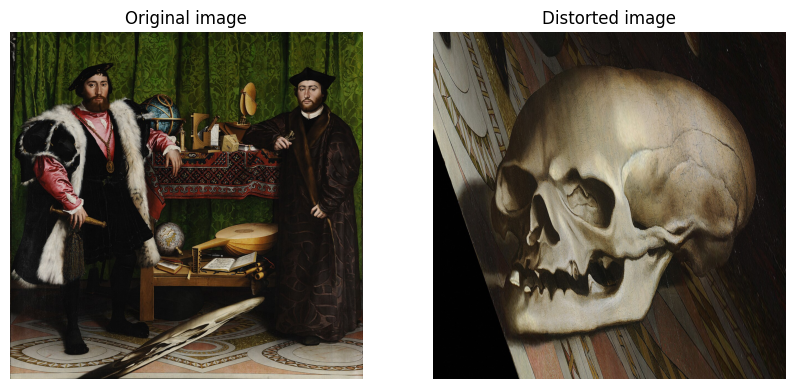

In [24]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img1 = cv2.imread("/content/the_ambassadors.jpg")
img2 = cv2.imread("/content/the_ambassadors_skull_transformed.jpg")

original_image_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
distorted_image_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

# Отображаем оба изображения для выбора контрольных точек
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(original_image_rgb)
plt.title('Original image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(distorted_image_rgb)
plt.title('Distorted image')
plt.axis('off')

plt.show()

Для данной задачи будем использовать Affine SIFT (ASIFT), так как он более устойчив к аффинным преобразованиям (наклоны, растяжения, масштаб). В данном случае с аноморфозом черепа искажения в изображениях значительные.

In [3]:
def compute_SIFT(img: np.ndarray) -> tuple[list[cv2.KeyPoint], np.ndarray, np.ndarray]:
    sift = cv2.AffineFeature_create(cv2.SIFT_create())
    keypoints, descriptors = sift.detectAndCompute(img, None)
    img_with_kp = cv2.drawKeypoints(img, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    return keypoints, descriptors, img_with_kp

In [4]:
def match_keypoints(des1: np.ndarray, des2: np.ndarray, ratio_thresh: float = 0.8) -> list[cv2.DMatch]:
    if des1 is None or des2 is None:
        return []

    bf = cv2.BFMatcher(cv2.NORM_L2)
    matches_knn = bf.knnMatch(des1, des2, k=2)

    filtered_matches = [
        m for m, n in matches_knn
        if m.distance < ratio_thresh * n.distance
    ]

    return filtered_matches

In [5]:
def draw_matches(
    img1: np.ndarray,
    kp1: list,
    img2: np.ndarray,
    kp2: list,
    matches: list[cv2.DMatch],
    max_matches: int = 50
):
    matched_vis = cv2.drawMatches(
        img1, kp1,
        img2, kp2,
        matches[:max_matches],  # Ограничим число матчей для наглядности
        None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )

    plt.figure(figsize=(12, 8))
    plt.imshow(matched_vis)
    plt.axis('off')
    plt.title(f"Top {min(len(matches), max_matches)} Matches")
    plt.tight_layout()
    plt.show()

In [6]:
def show_keypoints_image(img: np.ndarray, title: str):
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    keypoints, descriptors, img_with_kp = compute_SIFT(gray_img)
    plt.figure(figsize=(8, 8))
    plt.imshow(img_with_kp)
    plt.axis('off')
    plt.title(title)
    plt.tight_layout()
    plt.show()
    return keypoints, descriptors


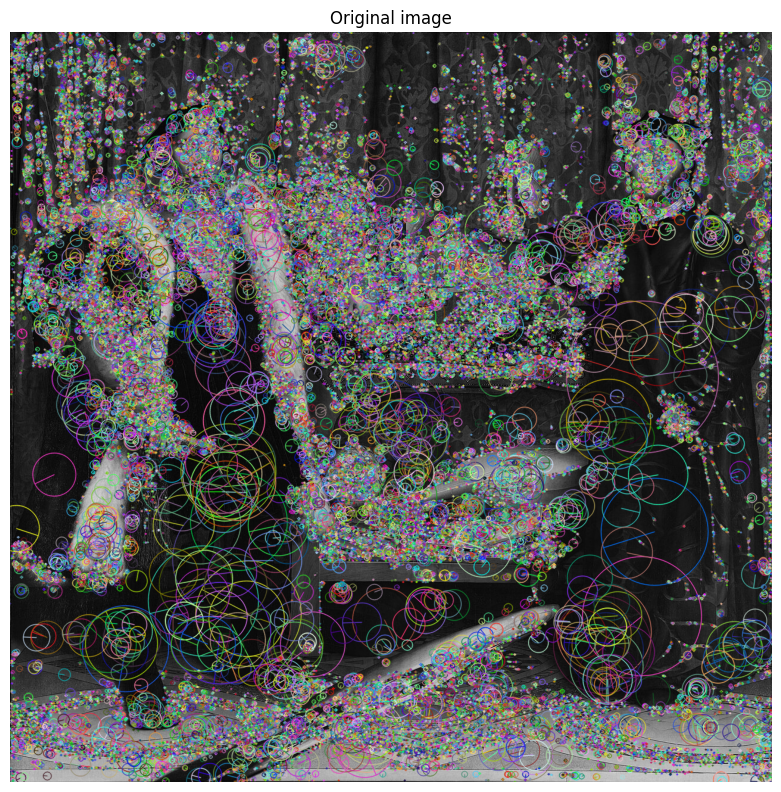

In [25]:
keypoints_1, descriptors_1 = show_keypoints_image(original_image_rgb, "Original image")

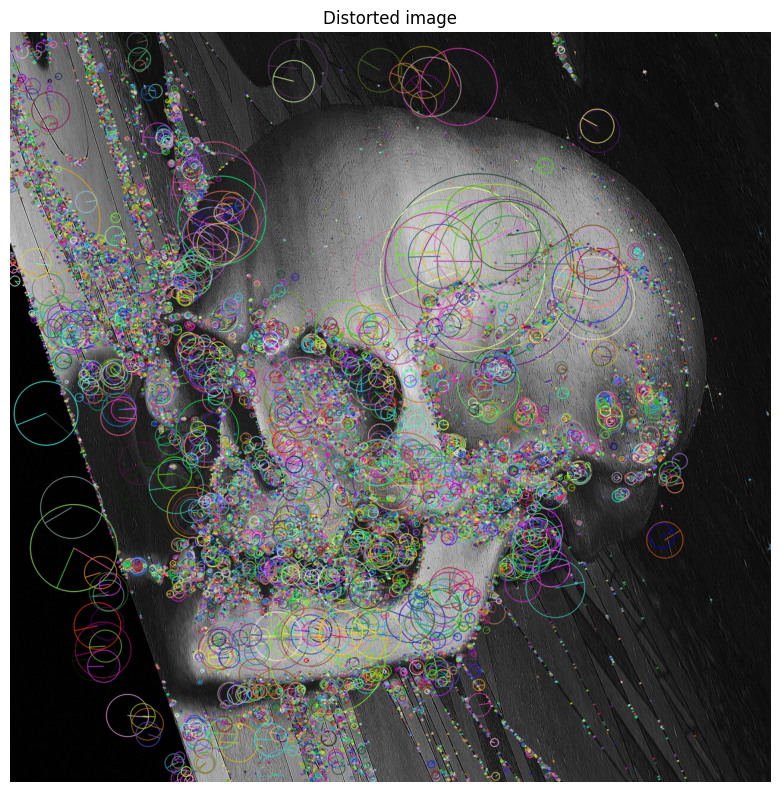

In [26]:
keypoints_2, descriptors_2 = show_keypoints_image(distorted_image_rgb, "Distorted image")

In [18]:
# 1. Сопоставляем дескрипторы с помощью теста Лоу
good_matches = match_keypoints(descriptors_2, descriptors_1, ratio_thresh=0.7)

# 2. Сортируем сопоставления по расстоянию
good_matches.sort(key=lambda m: m.distance)

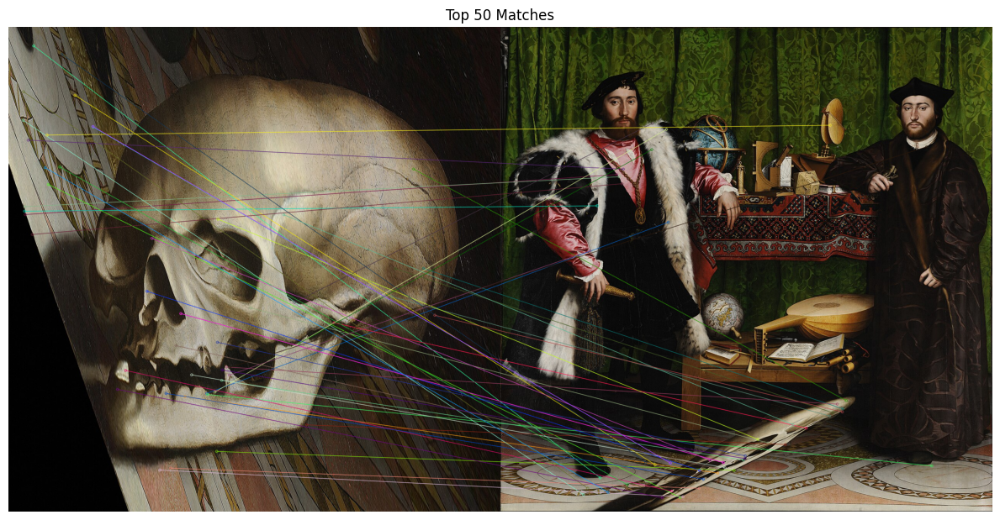

In [19]:
# Отображаем сопоставления
draw_matches(distorted_image_rgb, keypoints_2, original_image_rgb, keypoints_1, good_matches[:50])

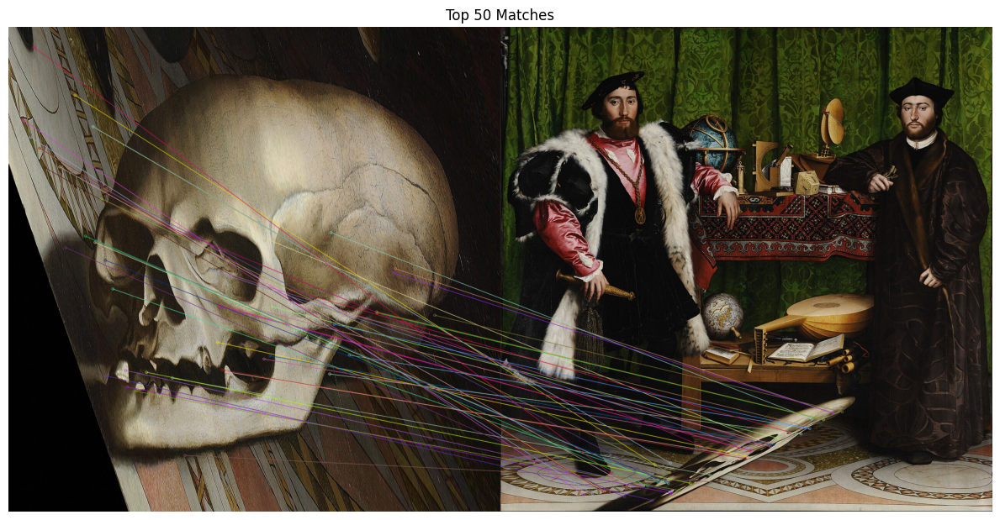

In [20]:
# Извлекаем пары соответствующих точек
original_pts = np.float32([keypoints_1[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
distorted_pts = np.float32([keypoints_2[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)

# Вычисляем матрицу гомографии
H, mask = cv2.findHomography(original_pts, distorted_pts, cv2.RANSAC, 5.0)

# Фильтруем соответствия
inlier_matches = [m for m, inl in zip(good_matches, mask.ravel()) if inl]

# Визуализизация inlier-сопоставления
draw_matches(distorted_image_rgb, keypoints_2, original_image_rgb, keypoints_1, inlier_matches[:50])

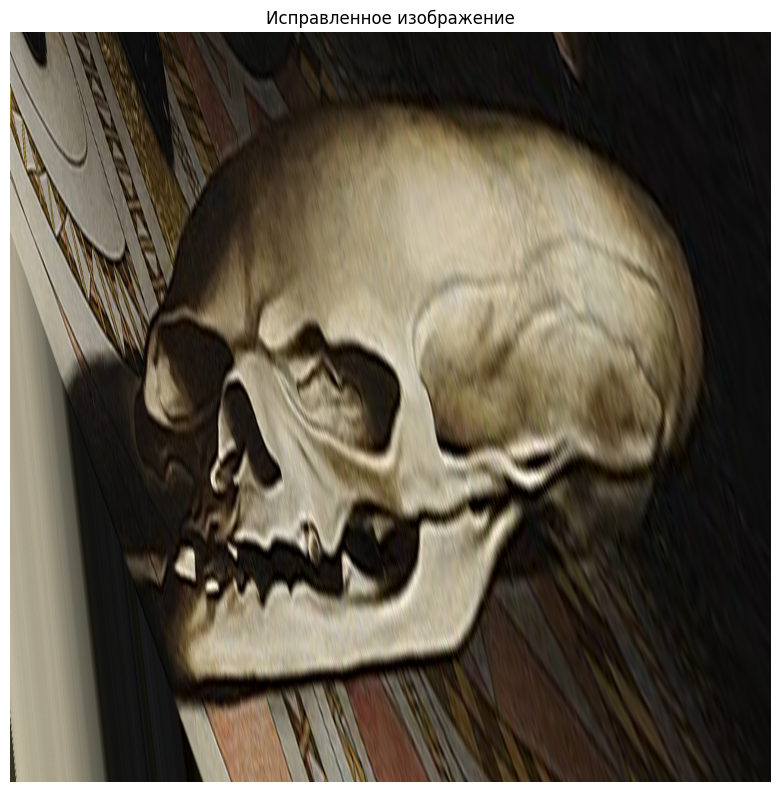

In [22]:
# Преобразуем оригинальное изображение по гомографии
h_dist, w_dist = distorted_image_rgb.shape[:2]
warped_image = cv2.warpPerspective(
    original_image_rgb, H, (w_dist, h_dist),
    flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE
)

# Отображаем результат
plt.figure(figsize=(8, 8))
plt.imshow(warped_image)
plt.title('Исправленное изображение')
plt.axis('off')
plt.tight_layout()
plt.show()

## Задача 2

Сделайте два фото одного и того же объекта с разных ракурсов.
Теперь **используйте SuperPoint для нахождения ключевых точек** на этих изображениях (веса - возьмите готовые).
Затем **используйте SuperGlue для сопоставления этих ключевых точек**.
Визуализируйте результат.

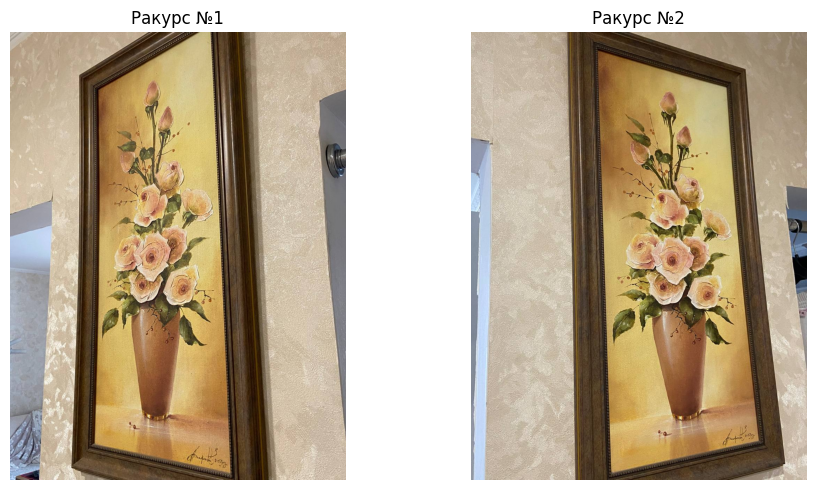

In [43]:
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from transformers import AutoImageProcessor, AutoModel

# Загрузка и подготовка изображений
def load_and_prepare_image(path):
    img_bgr = cv2.imread(path)
    return cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

img1 = load_and_prepare_image("/content/flower_1.jpg")
img2 = load_and_prepare_image("/content/flower_2.jpg")

# Отображение изображений
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(img1)
axs[0].set_title("Ракурс №1")
axs[0].axis("off")
axs[1].imshow(img2)
axs[1].set_title("Ракурс №2")
axs[1].axis("off")
plt.tight_layout()
plt.show()

In [39]:
# Загрузка модели SuperGlue через HuggingFace
images = [img1, img2]
processor = AutoImageProcessor.from_pretrained("magic-leap-community/superglue_indoor")
model = AutoModel.from_pretrained("magic-leap-community/superglue_indoor")

# Подготовка данных и запуск модели
inputs = processor(images, return_tensors="pt")
with torch.no_grad():
    outputs = model(**inputs)

In [40]:
# Получение ключевых точек и соответствий
image_sizes = [image.shape[:2] for image in images]
matches = processor.post_process_keypoint_matching(outputs, [image_sizes], threshold=0.5)[0]

# Вывод координат соответствий
for k0, k1, score in zip(matches["keypoints0"], matches["keypoints1"], matches["matching_scores"]):
    print(f"Keypoint {k0.numpy()} ↔ {k1.numpy()} with score {score:.3f}")

Keypoint [409 138] ↔ [568 170] with score 0.818
Keypoint [235 152] ↔ [346  24] with score 0.620
Keypoint [394 157] ↔ [561 168] with score 0.831
Keypoint [249 162] ↔ [360  50] with score 0.604
Keypoint [429 173] ↔ [586 205] with score 0.628
Keypoint [388 192] ↔ [537 202] with score 0.878
Keypoint [423 205] ↔ [585 242] with score 0.751
Keypoint [409 210] ↔ [571 240] with score 0.682
Keypoint [451 210] ↔ [615 266] with score 0.966
Keypoint [385 216] ↔ [543 229] with score 0.899
Keypoint [411 234] ↔ [573 264] with score 0.958
Keypoint [358 240] ↔ [510 232] with score 0.990
Keypoint [394 248] ↔ [552 264] with score 0.986
Keypoint [466 248] ↔ [630 312] with score 0.759
Keypoint [429 250] ↔ [591 288] with score 0.946
Keypoint [510 261] ↔ [673 344] with score 0.804
Keypoint [412 266] ↔ [574 296] with score 0.953
Keypoint [493 272] ↔ [657 344] with score 0.777
Keypoint [456 274] ↔ [621 338] with score 0.579
Keypoint [306 282] ↔ [439 232] with score 0.986
Keypoint [424 282] ↔ [588 322] with scor

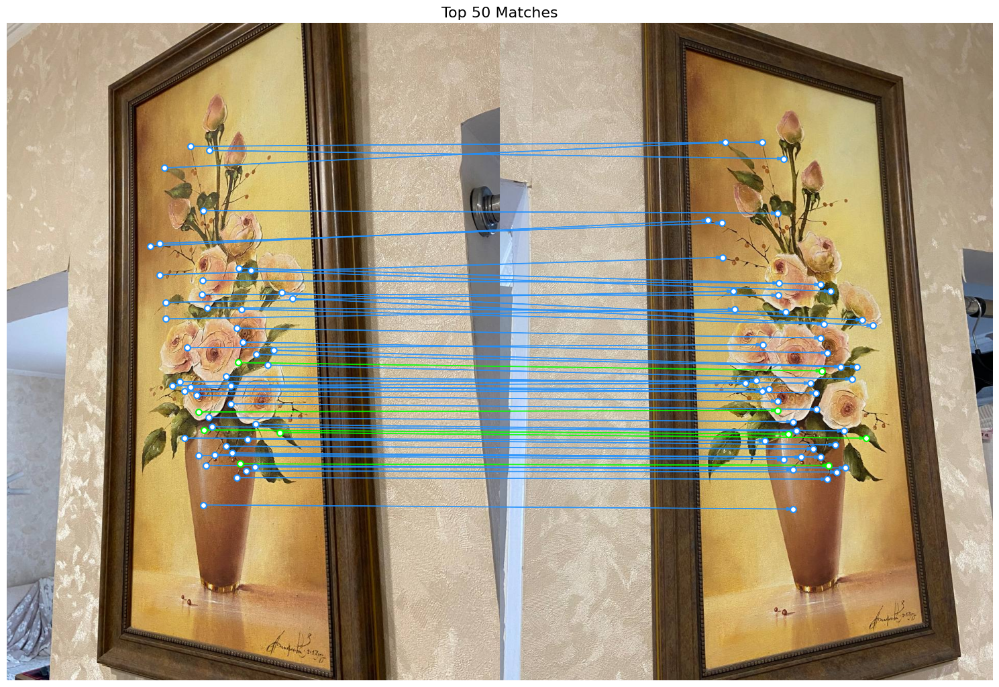

In [52]:
import matplotlib.patches as patches

# Визуализация
merged_img = np.hstack((img1, img2))
plt.figure(figsize=(15, 12))
plt.imshow(merged_img)
plt.axis("off")

offset = img1.shape[1]

for k0, k1, score in filtered_matches[:50]:
    x0, y0 = k0.numpy()
    x1, y1 = k1.numpy()
    x1 += offset

    # Цвет: синий — надёжный, зеленый — средний, желтый - менее надёжный
    if score > 0.985:
        color = "dodgerblue"
    elif score > 0.95:
        color = "lime"
    else:
        color = "gold"

    arrow = patches.FancyArrow(x0, y0, x1 - x0, y1 - y0,
                                width=0.5,
                                length_includes_head=True,
                                head_width=6, head_length=12,
                                color=color, alpha=0.8)
    plt.gca().add_patch(arrow)

    plt.scatter(x0, y0, c="white", edgecolors=color, linewidths=1.5, s=40, zorder=5)
    plt.scatter(x1, y1, c="white", edgecolors=color, linewidths=1.5, s=40, zorder=5)

plt.title(f"Top {len(filtered_matches[:50])} Matches", fontsize=16)
plt.tight_layout()
plt.show()


## Задание 3 (исследовательское)

Найдите свежий нейросетевой метод (2023 и моложе), реализующий детекцию и сопоставление ключевых точек (можно два метода, если они работают последовательно).
Напишите краткий обзор этого метода:
- Краткое описание (summary);
- Достоинства метода;
- Недостатки метода.

Ответ (обзор) - пишите в Markdown ячейке в этом ноутбуке.

LightGlue: Local Feature Matching at Light Speed (https://arxiv.org/pdf/2306.13643)
## 1. Краткое описание (summary)
LightGlue — это глубокая нейронная сеть, предназначенная для сопоставления локальных признаков между парами изображений. Она представляет собой развитие предыдущей модели SuperGlue, улучшая её по нескольким ключевым аспектам:
- Адаптивная архитектура - LightGlue динамически регулирует количество слоёв внимания в зависимости от сложности задачи сопоставления, что позволяет ускорить обработку простых пар изображений без потери качества на сложных;
- Модель оптимизирована для работы с меньшими затратами памяти и вычислительных ресурсов, сохраняя при этом высокую точность сопоставления;
- LightGlue может быть интегрирована с различными детекторами признаков, такими как SuperPoint, и легко обучается на стандартных датасетах.

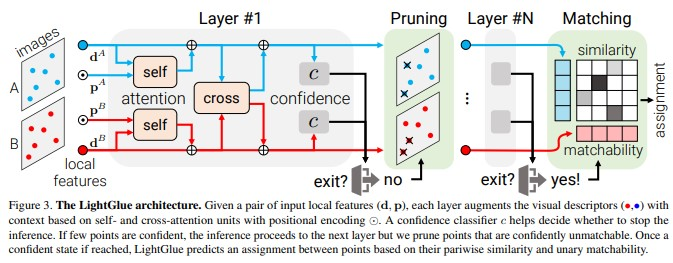

**Архитектура LightGlue** — это адаптивная трансформерная архитектура.

На вход модель получает пары дескрипторов и координат ключевых точек из двух изображений (например, от SuperPoint), к которым добавляется позиционное кодирование.

В каждом слое архитектуры выполняется self-attention отдельно для признаков каждого изображения, чтобы захватить внутрисценовые зависимости, и cross-attention между изображениями, чтобы выявить потенциальные соответствия между ключевыми точками. После этого каждый дескриптор проходит через confidence-классификатор, который предсказывает вероятность того, что данная точка будет сопоставлена. Если достаточное количество точек имеет высокую уверенность, модель прерывает дальнейшее вычисление (early exit), что значительно ускоряет обработку простых пар изображений. В противном случае модель переходит к следующему слою, предварительно отбрасывая точки, которые с большой вероятностью не будут сопоставлены (pruning).

На финальном слое происходит само сопоставление: между точками, прошедшими отбор, вычисляется попарная косинусная близость (similarity) и учитывается индивидуальная matchability, после чего формируется окончательная матрица соответствий.

Такая архитектура сочетает в себе высокую адаптивность, вычислительную эффективность и точность.

## 2. Достоинства метода
- LightGlue — первый метод, реализующий динамическую глубину трансформера для сопоставления ключевых точек, что позволяет обрабатывать простые случаи в 2–3 раза быстрее, чем SuperGlue, и при этом не жертвовать качеством в сложных сценах;
- В отличие от плотных методов вроде LoFTR и DKM, LightGlue работает с разреженными признаками, что делает его значительно менее ресурсоёмким по памяти и вычислениям. Тем не менее, благодаря вниманию и обучаемой matchability-оценке, он достигает точности, сопоставимой или превосходящей эти модели на стандартных бенчмарках (HPatches, MegaDepth и др.);
- LightGlue — полностью дифференцируемая, обучаемая и открытая система, которая легко интегрируется с любыми извлекателями признаков (SuperPoint, SIFT, R2D2 и др.), поддерживает обучение end-to-end, и отлично подходит для реального времени. Она не требует тонкой настройки на каждом датасете, и демонстрирует стабильные результаты в задачах визуальной локализации, SfM, SLAM и AR.

## 3. Недостатки метода
- В задачах, где важно покрытие всей сцены, методы, использующие плотные дескрипторы (LoFTR или DKM) зачастую показывают лучшее покрытие и устойчивость. LightGlue, работая с разреженными точками, может пропустить сопоставления в слабо выраженных или малотекстурированных областях, особенно при большом параллаксе или экстремальных изменениях ракурса;
- Поскольку LightGlue не включает в себя собственный детектор признаков, а полагается на внешний (чаще всего SuperPoint), его производительность жёстко ограничена качеством входных признаков. Если детектор выделяет мало точек или они плохо распределены по изображению, то он не сможет извлечь хорошее сопоставление, что делает данный метод более чувствительным к выбору препроцессинга.